In [1]:
############
# Imports #
############

import json
import os

import wandb
import pandas as pd
import rasterio
import torch
import torchvision.utils as vutils
import numpy as np

from torch.utils.data import DataLoader
from PIL import Image

from model.cnn_classifier import model_4D
from model.pseudomask import Pseudomasks
from utils.data_modules import ImageDataset, TestSet, filter_dataset

##################
## load configs ##
##################

# use this path when using vs code debugger.
# config_path = os.path.join('/home/nadjaflechner/palsa_seg/current_models/pseudomask_generation_model', 'configs.json')

config_path = os.path.join(os.getcwd(), 'configs/pseudomasks_configs.json')
with open(config_path, 'r') as config_file:
    configs = json.load(config_file)

# load paths configs dictionary
config_paths = configs.get('paths', {})
# assign paths
palsa_shapefile = config_paths.get('palsa_shapefile')
final_pseudomasks_dir = config_paths.get('final_pseudomasks_dir')
testset_dir = config_paths.get('testset')
parent_dir = config_paths.get('data')
rgb_dir = os.path.join(parent_dir, 'rgb')
hs_dir = os.path.join(parent_dir, 'hs')
dem_dir = os.path.join(parent_dir, 'dem')
labels_file = os.path.join(parent_dir, 'new_palsa_labels.csv')

# load model configs dictionary
config_model = configs.get('model', {})
# assign model
artifact_path = config_model.get('artifact_path')
run_id = config_model.get('run_id')
finetune = config_model.get('finetuned')

# load data configs dictionary
config_data = configs.get('data', {})
# assign data configs
n_samples = config_data.get('n_samples')
batch_size = config_data.get('batch_size')
im_size = config_data.get('im_size')
min_palsa_positive_samples = config_data.get('min_palsa_positive_samples')
augment = config_data.get('augment')
normalize = config_data.get('normalize')
depth_layer = config_data.get('depth_layer')

# load pseudomasks configs dictionary
config_pseudomasks = configs.get('pseudomasks', {})
# assign pseudomasks configs
cam_threshold_factor = config_pseudomasks.get('cam_threshold_factor')
overlap_threshold = config_pseudomasks.get('overlap_threshold')
snic_seeds = config_pseudomasks.get('snic_seeds')
snic_compactness = config_pseudomasks.get('snic_compactness')


#########################
# configure dataloaders #
#########################

GT_dir = "/Volumes/USB/Ground_truth/Optimize_GTs"

# choose depth data based on configs
depth_dir = hs_dir if depth_layer == "hs" else dem_dir
# Create the dataset and loaders for the entire dataset.
dataset = TestSet(depth_dir, GT_dir, normalize = False)
loader = DataLoader(dataset, batch_size=1, shuffle=True)

#############
# Init model: 

api = wandb.Api()
artifact = api.artifact(artifact_path, type='model')
artifact_dir = artifact.download()
state_dict = torch.load(f"{artifact_dir}/model.pth")
model = model_4D()
model.load_state_dict(state_dict)
model.eval()

#############################
# generate all pseudolabels #
#############################

pseudomask_generator = Pseudomasks(
    dataset, cam_threshold_factor, overlap_threshold,
    snic_seeds, snic_compactness, finetuned = finetune, std_from_mean=0
    )
pseudomask_generator.model = model.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))


wandb:   1 of 1 files downloaded.  


In [4]:
counter = 0
for im,binary_label,_,img_name in loader:

    # output paths:
    output_path_mask = os.path.join(final_pseudomasks_dir, 'masks', f"{img_name[0]}.png") 
    output_path_jpg = os.path.join(final_pseudomasks_dir, 'images', f"{img_name[0]}.jpg") 

    # Save RGB image
    vutils.save_image((im[:,:3,:,:]/255).cpu(), output_path_jpg, normalize = False)

    # Generate pseudomask 
    if binary_label == 0: 
        pseudomask = np.full((400, 400), False, dtype=bool)
    else:
        pseudomask = pseudomask_generator.generate_thresholded_CAM(im, None, save_plot=False)

    # Save pseudomask
    binary_pseudomask = np.squeeze(pseudomask.astype(np.uint8)) # convert bool to binary mask
    pseudomask_img = Image.fromarray(binary_pseudomask) # convert to pil img
    pseudomask_img.save(output_path_mask) # save as binary png

    counter+= 1

    if counter%100 ==0:
        print(f"{(counter/14567)*100} % of images produced")


0.6864831468387451 % of images produced
1.3729662936774902 % of images produced
2.0594494405162354 % of images produced
2.7459325873549805 % of images produced
3.4324157341937256 % of images produced
4.118898881032471 % of images produced
4.805382027871215 % of images produced
5.491865174709961 % of images produced
6.178348321548706 % of images produced
6.864831468387451 % of images produced
7.551314615226196 % of images produced
8.237797762064941 % of images produced
8.924280908903686 % of images produced
9.61076405574243 % of images produced
10.297247202581177 % of images produced
10.983730349419922 % of images produced
11.670213496258667 % of images produced
12.356696643097411 % of images produced
13.043179789936158 % of images produced
13.729662936774902 % of images produced
14.416146083613649 % of images produced
15.102629230452392 % of images produced
15.789112377291136 % of images produced
16.475595524129883 % of images produced
17.16207867096863 % of images produced
17.84856181

1

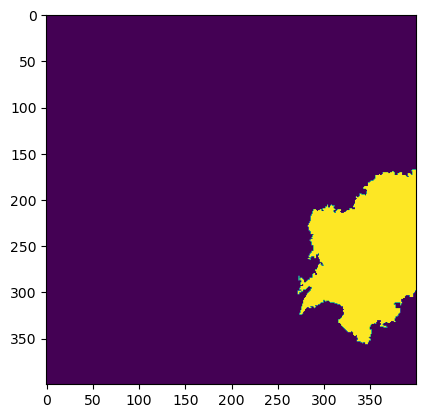

In [7]:
import matplotlib.pyplot as plt
immie = Image.open(output_path_mask)
plt.imshow(immie)
np.array(immie).max()

## Show some different threshold settings

In [1]:
import os

import numpy as np
import pandas as pd
import rasterio
import torch
from torch.autograd import Variable
import torch.nn as nn
from torch.utils.data import Dataset
from torchvision import transforms
import matplotlib.pyplot as plt

class SaveFeatures():
    features=None
    def __init__(self,m): self.hook = m.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output): self.features = output
    def remove(self): self.hook.remove()


def plot_cam(filename, model, std_from_mean, cam_threshold):
        with rasterio.open(f"/Volumes/USB/Ground_truth/All_GTs/rgb/{filename}.tif") as RGB_src:
        # Read the image data
            RGB_img = RGB_src.read()

        with rasterio.open(f"/Volumes/USB/Ground_truth/All_GTs/hs/{filename}.tif") as hs_src:
            # Read the image data
            hs_img = hs_src.read()

        # convert and upsample hs image
        hs_image_array = np.array(hs_img)
        hs_image_tensor = torch.from_numpy(hs_image_array)
        hs_image_tensor = hs_image_tensor.float()
        bilinear = nn.Upsample(size=200*2, mode='bilinear')
        hs_upsampled_tensor = bilinear(hs_image_tensor.unsqueeze(0)).squeeze(0)

        # converting RGB to tensor
        RGB_image_array = np.array(RGB_img)
        RGB_image_tensor = torch.from_numpy(RGB_image_array)
        RGB_image_tensor = RGB_image_tensor.float()

        combined_tensor = torch.concatenate((RGB_image_tensor, hs_upsampled_tensor)).unsqueeze(dim=0)

        #get the last convolution
        sf = SaveFeatures(model.features[-2])
        im = Variable(combined_tensor)
        outputs = model(combined_tensor)

        # generate CAM
        sf.remove()
        arr = sf.features.cpu().detach()#.numpy()

        pals_acts = torch.nn.functional.interpolate(
            input = arr[:,1,:,:].unsqueeze(1),
            scale_factor = combined_tensor.shape[3]/arr.shape[3],
            mode='bilinear'
        ).cpu().detach()

        if std_from_mean: 
            im_based_act_threshold = pals_acts.view(-1).mean() + std_from_mean * torch.std(pals_acts, dim=None)
            max_thresh = max([cam_threshold, im_based_act_threshold])
            pixels_activated = torch.where(torch.Tensor(pals_acts) > max_thresh, 1, 0).squeeze(0).permute(1,2,0).numpy()
         # if we use the global threshold 
        else:
            pixels_activated = torch.where(torch.Tensor(pals_acts) > cam_threshold, 1, 0).squeeze(0).permute(1,2,0).numpy()

        cpu_img = combined_tensor.squeeze().cpu().detach().permute(1,2,0).long().numpy()

        return cpu_img, pixels_activated #,combined_tensor


#### Plot various STDs

wandb:   1 of 1 files downloaded.  
/var/folders/wm/j23cgbjn0m15n_64hfkt3n500000gn/T/ipykernel_68430/279087359.py:53: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


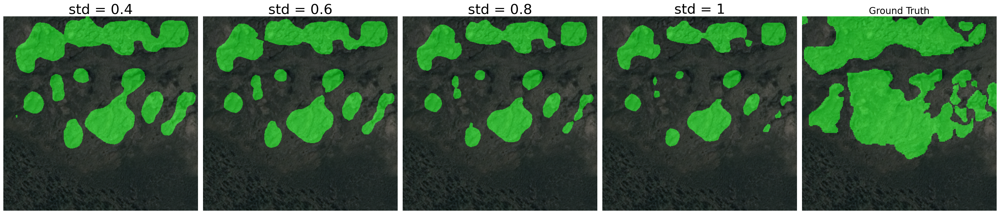

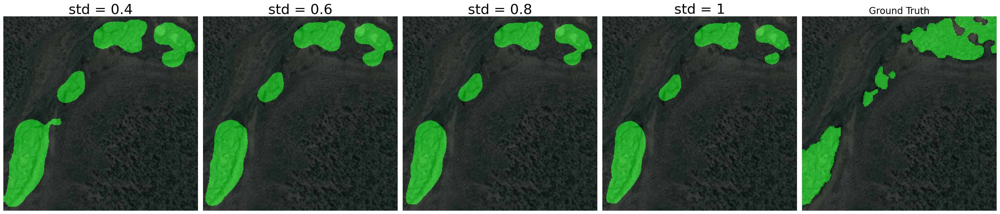

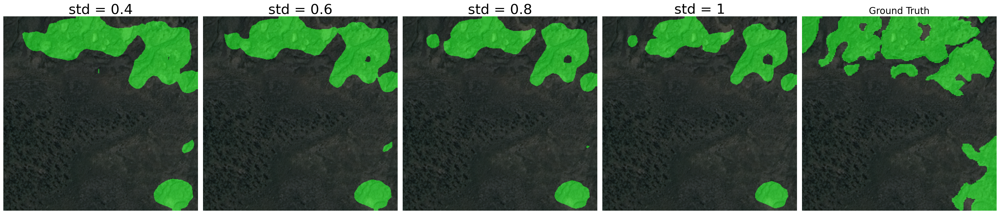

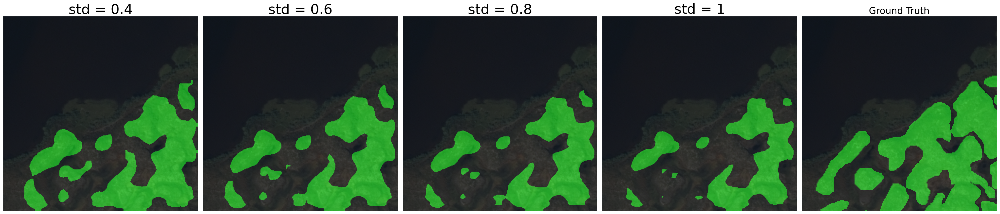

In [13]:
import wandb 
from model.cnn_classifier import model_4D
from PIL import Image

#############
# Plotting
#############

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# define model
model_path = "nadjaflechner/VGG_CAMs/classification_model:v61"
api = wandb.Api()
artifact = api.artifact(model_path, type='model')
artifact_dir = artifact.download()
state_dict = torch.load(f"{artifact_dir}/model.pth", map_location=torch.device('cpu'))
model = model_4D()
model.to(device)
model.load_state_dict(state_dict)
model.eval()

std_from_mean = [0.4,0.6,0.8,1]
cam_threshold = 0

# Plot
for filename in ['753_67_2550_2014_crop_51','753_67_2550_2014_crop_61','753_67_2550_2014_crop_62', '760_74_5025_2018_crop_48']:

    fig, ax = plt.subplots(1,len(std_from_mean)+1, figsize = (6+6*len(std_from_mean),8))

    for idx, std in enumerate(std_from_mean):

        cpu_img, pals_acts = plot_cam(filename, model, std, cam_threshold)

        # Ensure pals_acts is binary and has the same dimensions as cpu_img's RGB channels
        pals_acts_binary = (pals_acts > 0).astype(np.uint8)  # Convert to binary mask
        pseudomask_overlay = np.array(cpu_img[:,:,:3]) * 0.5 + pals_acts_binary * np.array([4, 250, 7]) * 0.5
        pseudomask_overlay = pseudomask_overlay.astype(np.uint8)
        ax[idx].imshow(pseudomask_overlay)
        ax[idx].set_title(f"std = {std}", size= 30)
        ax[idx].axis('off')

    GT = rasterio.open(f"/Volumes/USB/Ground_truth/All_GTs/groundtruth_mask/{filename}.tif").read()
    GT = np.squeeze(GT)  # Remove single-dimensional entries
    GT = np.array(Image.fromarray(GT).resize((400, 400), Image.NEAREST))  # Upsample to 400x400
    GT_binary = (GT > 0).astype(np.uint8)  # Convert to binary mask
    GT_overlay = np.array(cpu_img[:,:,:3]) * 0.5 + np.expand_dims(GT_binary, axis=2) * np.array([4, 250, 7]) * 0.5
    GT_overlay = GT_overlay.astype(np.uint8)
    ax[len(std_from_mean)].imshow(GT_overlay)
    ax[len(std_from_mean)].set_title("Ground Truth", size= 20)
    ax[len(std_from_mean)].axis('off')

    fig.tight_layout()
    fig.show()



### Plot various fixed thresholds

wandb:   1 of 1 files downloaded.  
/var/folders/wm/j23cgbjn0m15n_64hfkt3n500000gn/T/ipykernel_68430/2017206501.py:53: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


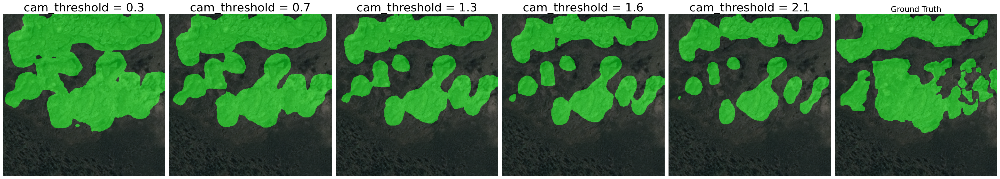

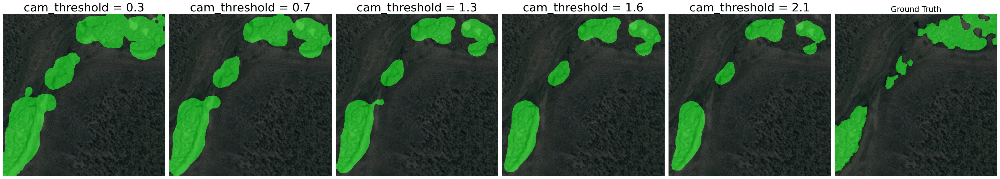

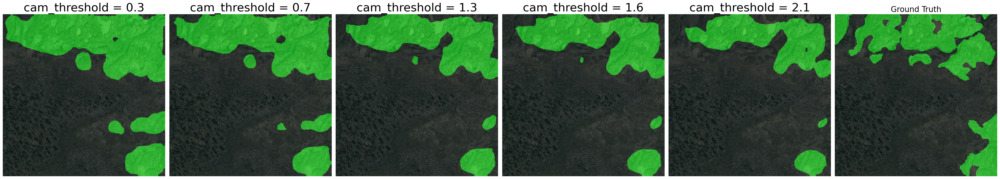

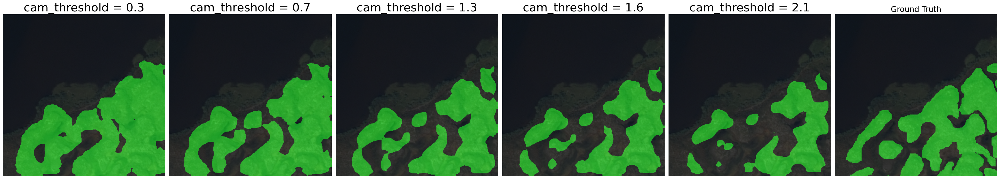

In [22]:
import wandb 
from model.cnn_classifier import model_4D
from PIL import Image

#############
# Plotting
#############

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# define model
model_path = "nadjaflechner/VGG_CAMs/classification_model:v61"
api = wandb.Api()
artifact = api.artifact(model_path, type='model')
artifact_dir = artifact.download()
state_dict = torch.load(f"{artifact_dir}/model.pth", map_location=torch.device('cpu'))
model = model_4D()
model.to(device)
model.load_state_dict(state_dict)
model.eval()

std_from_mean = None
cam_thresholds = [0.3,0.7,1.3,1.6,2.1]

# Plot
for filename in ['753_67_2550_2014_crop_51','753_67_2550_2014_crop_61','753_67_2550_2014_crop_62', '760_74_5025_2018_crop_48']:

    fig, ax = plt.subplots(1,len(cam_thresholds)+1, figsize = (6+6*len(cam_thresholds),8))

    for idx, cam_threshold in enumerate(cam_thresholds):

        cpu_img, pals_acts = plot_cam(filename, model, std_from_mean, cam_threshold)

        # Ensure pals_acts is binary and has the same dimensions as cpu_img's RGB channels
        pals_acts_binary = (pals_acts > 0).astype(np.uint8)  # Convert to binary mask
        pseudomask_overlay = np.array(cpu_img[:,:,:3]) * 0.5 + pals_acts_binary * np.array([4, 250, 7]) * 0.5
        pseudomask_overlay = pseudomask_overlay.astype(np.uint8)
        ax[idx].imshow(pseudomask_overlay)
        ax[idx].set_title(f"cam_threshold = {cam_threshold}", size= 30)
        ax[idx].axis('off')

    GT = rasterio.open(f"/Volumes/USB/Ground_truth/All_GTs/groundtruth_mask/{filename}.tif").read()
    GT = np.squeeze(GT)  # Remove single-dimensional entries
    GT = np.array(Image.fromarray(GT).resize((400, 400), Image.NEAREST))  # Upsample to 400x400
    GT_binary = (GT > 0).astype(np.uint8)  # Convert to binary mask
    GT_overlay = np.array(cpu_img[:,:,:3]) * 0.5 + np.expand_dims(GT_binary, axis=2) * np.array([4, 250, 7]) * 0.5
    GT_overlay = GT_overlay.astype(np.uint8)
    ax[len(cam_thresholds)].imshow(GT_overlay)
    ax[len(cam_thresholds)].set_title("Ground Truth", size= 20)
    ax[len(cam_thresholds)].axis('off')

    fig.tight_layout()
    fig.show()



## Trying all the above on the normalized model and data (soft pine)

still needs some work! somehow soft-pine is not finding any palsa... 

In [27]:
import os

import numpy as np
import pandas as pd
import rasterio
import torch
from torch.autograd import Variable
import torch.nn as nn
from torch.utils.data import Dataset
from torchvision import transforms
import matplotlib.pyplot as plt

class SaveFeatures():
    features=None
    def __init__(self,m): self.hook = m.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output): self.features = output
    def remove(self): self.hook.remove()


def plot_cam(filename, model, std_from_mean, cam_threshold):
        with rasterio.open(f"/Volumes/USB/Ground_truth/All_GTs/rgb/{filename}.tif") as RGB_src:
        # Read the image data
            RGB_img = RGB_src.read()

        with rasterio.open(f"/Volumes/USB/Ground_truth/All_GTs/hs/{filename}.tif") as hs_src:
            # Read the image data
            hs_img = hs_src.read()

        # convert and upsample hs image
        hs_image_array = np.array(hs_img)
        hs_image_tensor = torch.from_numpy(hs_image_array)
        hs_image_tensor = hs_image_tensor.float()
        bilinear = nn.Upsample(size=200*2, mode='bilinear')
        hs_upsampled_tensor = bilinear(hs_image_tensor.unsqueeze(0)).squeeze(0)

        # converting RGB to tensor
        RGB_image_array = np.array(RGB_img)
        RGB_image_tensor = torch.from_numpy(RGB_image_array)
        RGB_image_tensor = RGB_image_tensor.float()

        orig_combined_tensor = torch.concatenate((RGB_image_tensor, hs_upsampled_tensor)).unsqueeze(dim=0)
        combined_tensor = transforms.Normalize(mean=[74.90, 85.26, 80.06, 179.18],
                                               std=[15.05, 13.88, 12.01, 10.65])(orig_combined_tensor)

    
        #get the last convolution
        sf = SaveFeatures(model.features[-2])
        im = Variable(combined_tensor)
        outputs = model(combined_tensor)

        # generate CAM
        sf.remove()
        arr = sf.features.cpu().detach()#.numpy()

        pals_acts = torch.nn.functional.interpolate(
            input = arr[:,1,:,:].unsqueeze(1),
            scale_factor = combined_tensor.shape[3]/arr.shape[3],
            mode='bilinear'
        ).cpu().detach()

        if std_from_mean: 
            im_based_act_threshold = pals_acts.view(-1).mean() + std_from_mean * torch.std(pals_acts, dim=None)
            max_thresh = max([cam_threshold, im_based_act_threshold])
            pixels_activated = torch.where(torch.Tensor(pals_acts) > max_thresh, 1, 0).squeeze(0).permute(1,2,0).numpy()
         # if we use the global threshold 
        else:
            pixels_activated = torch.where(torch.Tensor(pals_acts) > cam_threshold, 1, 0).squeeze(0).permute(1,2,0).numpy()

        cpu_img = orig_combined_tensor.squeeze().cpu().detach().permute(1,2,0).long().numpy()

        return cpu_img, pixels_activated #,combined_tensor


wandb:   1 of 1 files downloaded.  
/var/folders/wm/j23cgbjn0m15n_64hfkt3n500000gn/T/ipykernel_68430/2009894810.py:53: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


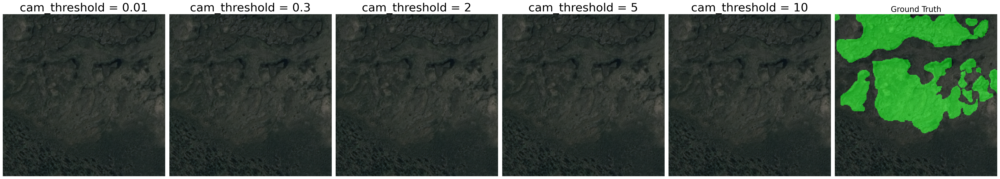

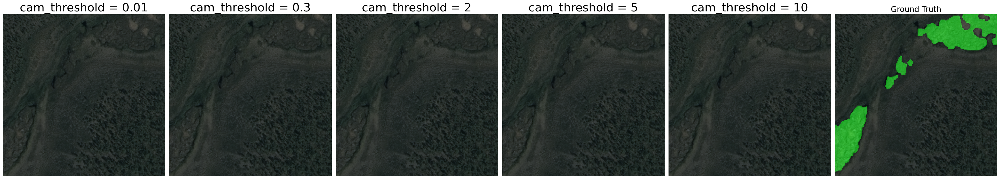

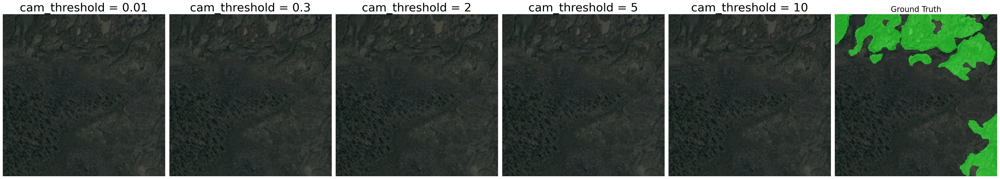

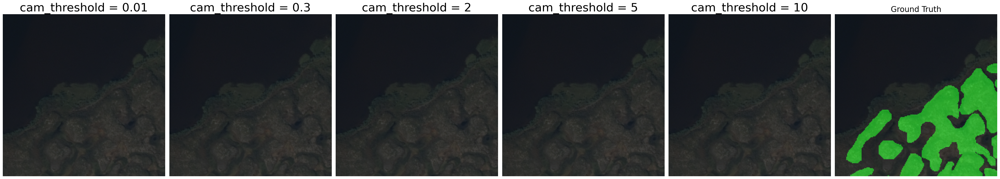

In [28]:
import wandb 
from model.cnn_classifier import model_4D
from PIL import Image

#############
# Plotting
#############

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# define model
model_path = "nadjaflechner/VGG_CAMs/classification_model:v67"
api = wandb.Api()
artifact = api.artifact(model_path, type='model')
artifact_dir = artifact.download()
state_dict = torch.load(f"{artifact_dir}/model.pth", map_location=torch.device('cpu'))
model = model_4D()
model.to(device)
model.load_state_dict(state_dict)
model.eval()

std_from_mean = None
cam_thresholds = [0.01,0.3,2,5,10]

# Plot
for filename in ['753_67_2550_2014_crop_51','753_67_2550_2014_crop_61','753_67_2550_2014_crop_62', '760_74_5025_2018_crop_48']:

    fig, ax = plt.subplots(1,len(cam_thresholds)+1, figsize = (6+6*len(cam_thresholds),8))

    for idx, cam_threshold in enumerate(cam_thresholds):

        cpu_img, pals_acts = plot_cam(filename, model, std_from_mean, cam_threshold)

        # Ensure pals_acts is binary and has the same dimensions as cpu_img's RGB channels
        pals_acts_binary = (pals_acts > 0).astype(np.uint8)  # Convert to binary mask
        pseudomask_overlay = np.array(cpu_img[:,:,:3]) * 0.5 + pals_acts_binary * np.array([4, 250, 7]) * 0.5
        pseudomask_overlay = pseudomask_overlay.astype(np.uint8)
        ax[idx].imshow(pseudomask_overlay)
        ax[idx].set_title(f"cam_threshold = {cam_threshold}", size= 30)
        ax[idx].axis('off')

    GT = rasterio.open(f"/Volumes/USB/Ground_truth/All_GTs/groundtruth_mask/{filename}.tif").read()
    GT = np.squeeze(GT)  # Remove single-dimensional entries
    GT = np.array(Image.fromarray(GT).resize((400, 400), Image.NEAREST))  # Upsample to 400x400
    GT_binary = (GT > 0).astype(np.uint8)  # Convert to binary mask
    GT_overlay = np.array(cpu_img[:,:,:3]) * 0.5 + np.expand_dims(GT_binary, axis=2) * np.array([4, 250, 7]) * 0.5
    GT_overlay = GT_overlay.astype(np.uint8)
    ax[len(cam_thresholds)].imshow(GT_overlay)
    ax[len(cam_thresholds)].set_title("Ground Truth", size= 20)
    ax[len(cam_thresholds)].axis('off')

    fig.tight_layout()
    fig.show()



### Plot Otsus

In [5]:
import os

import numpy as np
import pandas as pd
import rasterio
import torch
from torch.autograd import Variable
import torch.nn as nn
from torch.utils.data import Dataset
from torchvision import transforms
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu

class SaveFeatures():
    features=None
    def __init__(self,m): self.hook = m.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output): self.features = output
    def remove(self): self.hook.remove()

def plot_cam(filename, model):
        with rasterio.open(f"/Volumes/USB/Ground_truth/All_GTs/rgb/{filename}.tif") as RGB_src:
        # Read the image data
            RGB_img = RGB_src.read()

        with rasterio.open(f"/Volumes/USB/Ground_truth/All_GTs/hs/{filename}.tif") as hs_src:
            # Read the image data
            hs_img = hs_src.read()

        # convert and upsample hs image
        hs_image_array = np.array(hs_img)
        hs_image_tensor = torch.from_numpy(hs_image_array)
        hs_image_tensor = hs_image_tensor.float()
        bilinear = nn.Upsample(size=200*2, mode='bilinear')
        hs_upsampled_tensor = bilinear(hs_image_tensor.unsqueeze(0)).squeeze(0)

        # converting RGB to tensor
        RGB_image_array = np.array(RGB_img)
        RGB_image_tensor = torch.from_numpy(RGB_image_array)
        RGB_image_tensor = RGB_image_tensor.float()

        combined_tensor = torch.concatenate((RGB_image_tensor, hs_upsampled_tensor)).unsqueeze(dim=0)
    
        #get the last convolution
        sf = SaveFeatures(model.features[-2])
        im = Variable(combined_tensor)
        outputs = model(combined_tensor)

        # generate CAM
        sf.remove()
        arr = sf.features.cpu().detach()#.numpy()

        pals_acts = torch.nn.functional.interpolate(
            input = arr[:,1,:,:].unsqueeze(1),
            scale_factor = combined_tensor.shape[3]/arr.shape[3],
            mode='bilinear'
        ).cpu().detach()

        cam = pals_acts / pals_acts.max()
        cam = np.array(cam.squeeze())
        threshold = threshold_otsu(cam)
        binary_mask = (cam > threshold).astype(np.uint8)

        cpu_img = combined_tensor.squeeze().cpu().detach().permute(1,2,0).long().numpy()

        return cpu_img, binary_mask #,combined_tensor


wandb:   1 of 1 files downloaded.  
/var/folders/wm/j23cgbjn0m15n_64hfkt3n500000gn/T/ipykernel_31370/3526918986.py:50: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


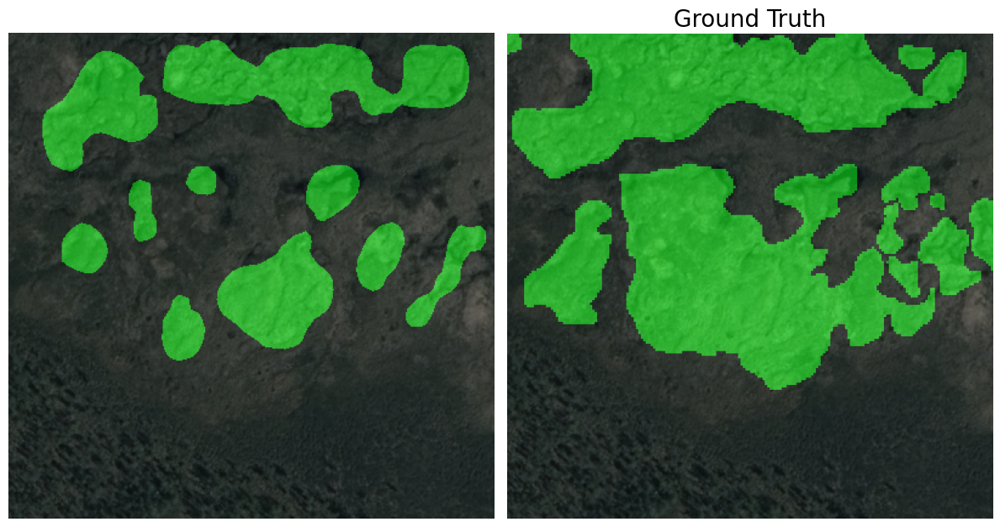

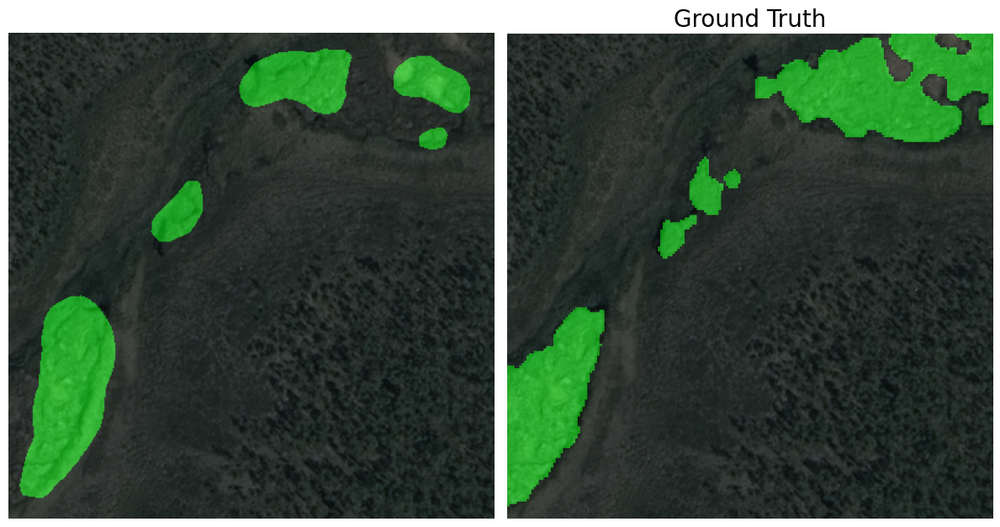

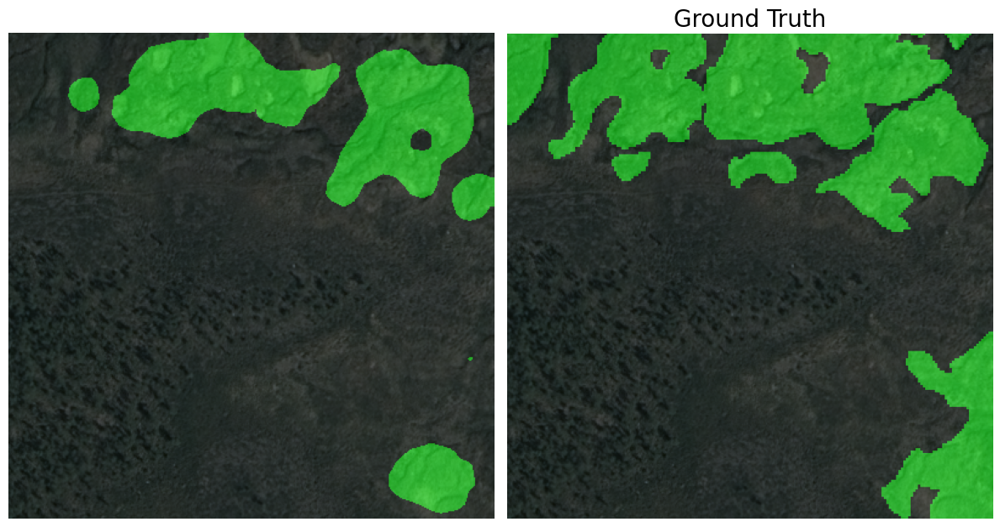

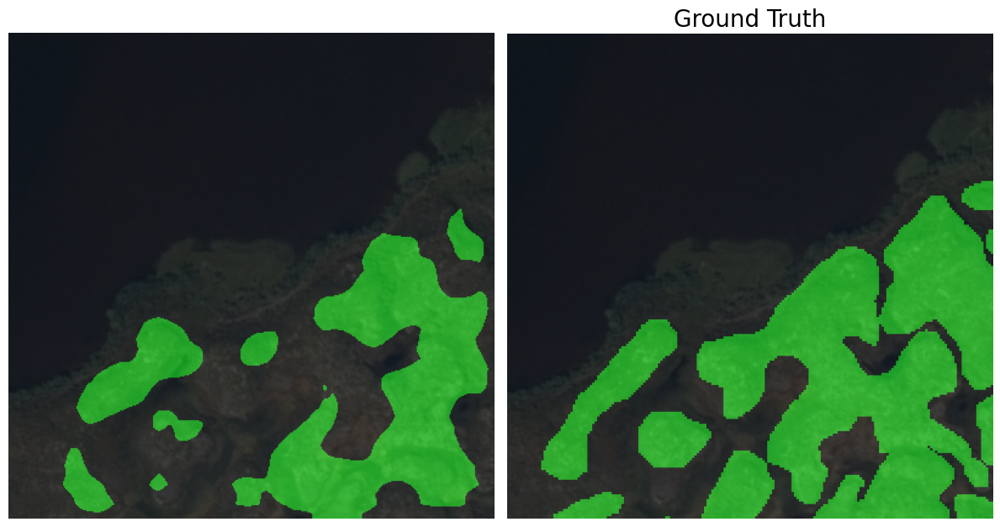

In [6]:
import wandb 
from model.cnn_classifier import model_4D
from PIL import Image

#############
# Plotting
#############

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# define model
model_path = "nadjaflechner/VGG_CAMs/classification_model:v61"
api = wandb.Api()
artifact = api.artifact(model_path, type='model')
artifact_dir = artifact.download()
state_dict = torch.load(f"{artifact_dir}/model.pth", map_location=torch.device('cpu'))
model = model_4D()
model.to(device)
model.load_state_dict(state_dict)
model.eval()

std_from_mean = None

# Plot
for filename in ['753_67_2550_2014_crop_51','753_67_2550_2014_crop_61','753_67_2550_2014_crop_62', '760_74_5025_2018_crop_48']:

    fig, ax = plt.subplots(1,2, figsize = (12,8))

    cpu_img, pals_acts = plot_cam(filename, model)

    # Ensure pals_acts is binary and has the same dimensions as cpu_img's RGB channels
    pals_acts_binary = (pals_acts > 0).astype(np.uint8)  # Convert to binary mask
    pals_acts_binary_expanded = np.expand_dims(pals_acts_binary, axis=-1)  # Expand dimensions to match RGB channels
    pseudomask_overlay = np.array(cpu_img[:,:,:3]) * 0.5 + pals_acts_binary_expanded * np.array([4, 250, 7]) * 0.5
    pseudomask_overlay = pseudomask_overlay.astype(np.uint8)
    ax[0].imshow(pseudomask_overlay)
    ax[0].axis('off')

    GT = rasterio.open(f"/Volumes/USB/Ground_truth/All_GTs/groundtruth_mask/{filename}.tif").read()
    GT = np.squeeze(GT)  # Remove single-dimensional entries
    GT = np.array(Image.fromarray(GT).resize((400, 400), Image.NEAREST))  # Upsample to 400x400
    GT_binary = (GT > 0).astype(np.uint8)  # Convert to binary mask
    GT_overlay = np.array(cpu_img[:,:,:3]) * 0.5 + np.expand_dims(GT_binary, axis=2) * np.array([4, 250, 7]) * 0.5
    GT_overlay = GT_overlay.astype(np.uint8)
    ax[1].imshow(GT_overlay)
    ax[1].set_title("Ground Truth", size= 20)
    ax[1].axis('off')

    fig.tight_layout()
    fig.show()



### Code to generate the Otsu pseudomasks

In [5]:
import wandb 
from model.cnn_classifier import model_4D
from PIL import Image
import json
import os

import wandb
import pandas as pd
import rasterio
import torch
import torchvision.utils as vutils
import numpy as np

from torch.utils.data import DataLoader
from PIL import Image

from model.cnn_classifier import model_4D
from model.pseudomask import Pseudomasks
from utils.data_modules import ImageDataset, TestSet, filter_dataset

#############
# Plotting
#############

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

orig_dir = "/Volumes/USB/Orig_200m_TIFS"
final_pseudomasks_dir = "/Volumes/USB/Pseudomasks"

# choose depth data based on configs
depth_dir = "/Volumes/USB/Orig_200m_TIFS/hs" 
RGB_dir = "/Volumes/USB/Orig_200m_TIFS/rgb"
im_size = 200
normalize = False
all_labels_df = pd.read_csv("/Volumes/USB/Orig_200m_TIFS/new_palsa_labels.csv", index_col=0)
filenames = [f.split('.')[0] for f in os.listdir(RGB_dir) if not f.endswith('_aug.tif')]
labels_df = all_labels_df.loc[all_labels_df.index.isin(filenames)]

# Create the dataset and loaders for the entire dataset.
dataset = ImageDataset(depth_dir, RGB_dir, labels_df, im_size, normalize = False)
loader = DataLoader(dataset, batch_size=1, shuffle=True)

# define model
model_path = "nadjaflechner/VGG_CAMs/classification_model:v61"
api = wandb.Api()
artifact = api.artifact(model_path, type='model')
artifact_dir = artifact.download()
state_dict = torch.load(f"{artifact_dir}/model.pth", map_location=torch.device('cpu'))
model = model_4D()
model.to(device)
model.load_state_dict(state_dict)
model.eval()

std_from_mean = None

pseudomask_generator = Pseudomasks(
    loader, None, None,
    None, None, None, std_from_mean=0
    )
pseudomask_generator.model = model.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))


wandb:   1 of 1 files downloaded.  


In [14]:
counter = 0
failed_images = []  # List to log images that didn't work
for _ in range(len(loader)):  # Iterate over the range of the loader
    try:
        im, binary_label, _, img_name = next(iter(loader)) 
        # output paths:
        output_path_mask = os.path.join(final_pseudomasks_dir, 'masks', f"{img_name[0]}.png") 
        output_path_jpg = os.path.join(final_pseudomasks_dir, 'images', f"{img_name[0]}.jpg") 

        # Save RGB image
        vutils.save_image((im[:, :3, :, :] / 255).cpu(), output_path_jpg, normalize=False)

        # Generate pseudomask 
        if binary_label == 0: 
            pseudomask = np.full((400, 400), False, dtype=bool)
        else:
            pseudomask = pseudomask_generator.generate_otsu_CAM(im, None, save_plot=False)

        # Save pseudomask
        binary_pseudomask = np.squeeze(pseudomask.astype(np.uint8))  # convert bool to binary mask
        pseudomask_img = Image.fromarray(binary_pseudomask)  # convert to pil img
        pseudomask_img.save(output_path_mask)  # save as binary png

    except rasterio.errors.RasterioIOError as e:
        print(f"An error occurred while processing index {counter} ({img_name}): {e}")
        failed_images.append(img_name)

    counter += 1

    if counter % 100 == 0:
        print(f"{(counter / 15100) * 100} % of images produced")
        
# Optionally, print or save the failed images log
if failed_images:
    print(f"Failed to process {len(failed_images)} images:")
    for img_name in failed_images:
        print(f"Image: {img_name}")


An error occurred while processing index 23 (('764_75_2500_2015_crop_26',)): '/Volumes/USB/Orig_200m_TIFS/rgb/761_76_7550_2015_crop_14.tif' not recognized as a supported file format.
0.6622516556291391 % of images produced
1.3245033112582782 % of images produced
1.9867549668874174 % of images produced
2.6490066225165565 % of images produced
3.3112582781456954 % of images produced
3.9735099337748347 % of images produced
4.635761589403973 % of images produced
5.298013245033113 % of images produced
5.960264900662252 % of images produced
6.622516556291391 % of images produced
7.28476821192053 % of images produced
7.9470198675496695 % of images produced
8.609271523178808 % of images produced
9.271523178807946 % of images produced
9.933774834437086 % of images produced
10.596026490066226 % of images produced
11.258278145695364 % of images produced
11.920529801324504 % of images produced
12.582781456953644 % of images produced
13.245033112582782 % of images produced
13.90728476821192 % of ima

1

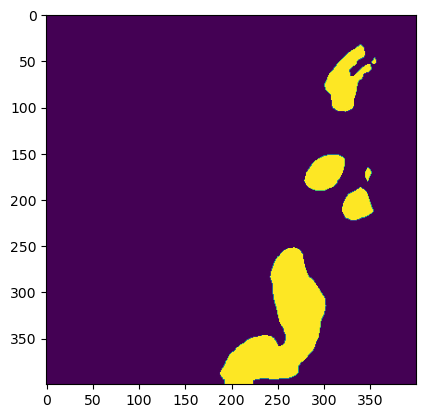

In [9]:
import matplotlib.pyplot as plt
immie = Image.open("/Volumes/USB/Pseudomasks/masks/746_57_5025_2015_crop_105.png")
plt.imshow(immie)
np.array(immie).max()

#### Code to generate thresholded CAMs 

In [5]:
import wandb 
from model.cnn_classifier import model_4D
from PIL import Image
import json
import os

import wandb
import pandas as pd
import rasterio
import torch
import torchvision.utils as vutils
import numpy as np

from torch.utils.data import DataLoader
from PIL import Image

from model.cnn_classifier import model_4D
from model.pseudomask import Pseudomasks
from utils.data_modules import ImageDataset, TestSet, filter_dataset

#############
# Plotting
#############

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

orig_dir = "/Volumes/USB/Orig_200m_TIFS"
final_pseudomasks_dir = "/Volumes/USB/Thresholded_CAM"

# choose depth data based on configs
depth_dir = "/Volumes/USB/Orig_200m_TIFS/hs" 
RGB_dir = "/Volumes/USB/Orig_200m_TIFS/rgb"
im_size = 200
normalize = False
all_labels_df = pd.read_csv("/Volumes/USB/Orig_200m_TIFS/new_palsa_labels.csv", index_col=0)
filenames = [f.split('.')[0] for f in os.listdir(RGB_dir) if not f.endswith('_aug.tif')]
labels_df = all_labels_df.loc[all_labels_df.index.isin(filenames)]

# Create the dataset and loaders for the entire dataset.
dataset = ImageDataset(depth_dir, RGB_dir, labels_df, im_size, normalize = False)
loader = DataLoader(dataset, batch_size=1, shuffle=True)

# define model
model_path = "nadjaflechner/VGG_CAMs/classification_model:v61"
api = wandb.Api()
artifact = api.artifact(model_path, type='model')
artifact_dir = artifact.download()
state_dict = torch.load(f"{artifact_dir}/model.pth", map_location=torch.device('cpu'))
model = model_4D()
model.to(device)
model.load_state_dict(state_dict)
model.eval()

std_from_mean = None

pseudomask_generator = Pseudomasks(
    loader, 0.87, None,
    None, None, None, std_from_mean=0
    )
pseudomask_generator.model = model.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))


wandb:   1 of 1 files downloaded.  


In [6]:
counter = 0
failed_images = []  # List to log images that didn't work
for _ in range(len(loader)):  # Iterate over the range of the loader
    try:
        im, binary_label, _, img_name = next(iter(loader)) 
        # output paths:
        output_path_mask = os.path.join(final_pseudomasks_dir, 'masks', f"{img_name[0]}.png") 
        output_path_jpg = os.path.join(final_pseudomasks_dir, 'images', f"{img_name[0]}.jpg") 

        # Save RGB image
        vutils.save_image((im[:, :3, :, :] / 255).cpu(), output_path_jpg, normalize=False)

        # Generate pseudomask 
        if binary_label == 0: 
            pseudomask = np.full((400, 400), False, dtype=bool)
        else:
            pseudomask = pseudomask_generator.generate_thresholded_CAM(im, None, save_plot=False)

        # Save pseudomask
        binary_pseudomask = np.squeeze(pseudomask.astype(np.uint8))  # convert bool to binary mask
        pseudomask_img = Image.fromarray(binary_pseudomask)  # convert to pil img
        pseudomask_img.save(output_path_mask)  # save as binary png

    except rasterio.errors.RasterioIOError as e:
        print(f"An error occurred while processing index {counter} ({img_name}): {e}")
        failed_images.append(img_name)

    counter += 1

    if counter % 100 == 0:
        print(f"{(counter / 15100) * 100} % of images produced")
        
# Optionally, print or save the failed images log
if failed_images:
    print(f"Failed to process {len(failed_images)} images:")
    for img_name in failed_images:
        print(f"Image: {img_name}")


0.6622516556291391 % of images produced
1.3245033112582782 % of images produced
1.9867549668874174 % of images produced
2.6490066225165565 % of images produced
3.3112582781456954 % of images produced
3.9735099337748347 % of images produced
4.635761589403973 % of images produced
5.298013245033113 % of images produced
5.960264900662252 % of images produced
6.622516556291391 % of images produced
7.28476821192053 % of images produced
7.9470198675496695 % of images produced
8.609271523178808 % of images produced
9.271523178807946 % of images produced
9.933774834437086 % of images produced
10.596026490066226 % of images produced
11.258278145695364 % of images produced
11.920529801324504 % of images produced
12.582781456953644 % of images produced
13.245033112582782 % of images produced
13.90728476821192 % of images produced
An error occurred while processing index 2189 (('761_73_0000_2018_crop_13',)): '/Volumes/USB/Orig_200m_TIFS/rgb/763_73_5000_2018_negcrop_8.tif' not recognized as a suppor

In [9]:
import pandas as pd 

all_imgs = "/Volumes/USB/Thresholded_CAM/new_palsa_labels.csv"
all_imgs_df = pd.read_csv(all_imgs, names= ['filename', 'palsa'], header = 0)
all_imgs_df.head()

,filename,palsa
0,760_73_5025_2018_crop_14,7.25
1,760_73_5025_2018_crop_15,0.75
2,760_73_5025_2018_crop_16,3.25
3,760_73_5025_2018_crop_17,1.50
4,760_73_5025_2018_crop_18,7.50


In [16]:
all_imgs_dir = "/Volumes/USB/Thresholded_CAM/images"

# Get the list of image filenames in all_imgs_dir without the .jpg extension
image_filenames = [filename[:-4] for filename in os.listdir(all_imgs_dir) if filename.endswith('.jpg')]

# Filter all_imgs_df to keep only the rows with filenames present in image_filenames
filtered_df = all_imgs_df[all_imgs_df['filename'].isin(image_filenames)]

# Count how many images in the directory are not in the df
missing_images_count = len(image_filenames) - len(filtered_df)

# Print the number of missing images
print(f"Number of images in the directory not in the dataframe: {missing_images_count}")


Number of images in the directory not in the dataframe: 9580


,palsa
filename,
760_73_5025_2018_crop_17,1.50
760_73_5025_2018_crop_18,7.50
760_73_5025_2018_crop_21,2.75
760_73_5025_2018_crop_22,8.50
760_73_5025_2018_crop_23,13.75


In [30]:
# filtered_df
# filtered_df.set_index('filename', inplace=True)

test_df = filtered_df[filtered_df.index.isin([filename[:-4] for filename in os.listdir("/Volumes/USB/Pseudomasks/TEST/masks")])]
train_df = filtered_df[~filtered_df.index.isin([filename[:-4] for filename in os.listdir("/Volumes/USB/Pseudomasks/TEST/masks")])]

# Save the train and test dataframes as CSV files
train_df.to_csv('/Volumes/USB/Thresholded_CAM/TRAIN/orig_palsa_labels.csv', index=True)
test_df.to_csv('/Volumes/USB/Thresholded_CAM/TEST/orig_palsa_labels.csv', index=True)



In [33]:
mask_filenames = [filename[:-4] for filename in os.listdir("/Volumes/USB/Pseudomasks/TEST/masks")]
overlap_count = len(filtered_df.index.intersection(mask_filenames))
print(f"Number of overlapping filenames: {overlap_count}")

Number of overlapping filenames: 44


In [34]:
len(train_df)

9536

In [38]:
import os
import shutil

# Get the list of mask filenames in the source directory
mask_filenames = [filename[:-4] for filename in os.listdir("/Volumes/USB/Thresholded_CAM/images")]

# Get the list of filenames in the TEST masks directory
test_mask_filenames = [filename[:-4] for filename in os.listdir("/Volumes/USB/Pseudomasks/TEST/masks")]

# Identify the overlapping filenames
overlapping_filenames = set(mask_filenames).intersection(test_mask_filenames)

# Move the overlapping files from TEST masks to the new directory
for filename in overlapping_filenames:
    if not filename.startswith('._'):
        src = f"/Volumes/USB/Thresholded_CAM/images/{filename}.jpg"
        dst = f"/Volumes/USB/Thresholded_CAM/TEST/images/{filename}.jpg"
        shutil.move(src, dst)
q


In [26]:
pd.read_csv("/Volumes/USB/Pseudomasks/TEST/orig_palsa_labels.csv").head()

,filename,palsa
0,757_69_5050_2014_crop_25,1.50
1,757_69_5050_2014_crop_26,0.50
2,757_69_5050_2014_crop_30,3.00
3,753_67_2550_2014_crop_36,1.25
4,753_67_2550_2014_crop_51,41.50
